# Niche Grouping Project

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
Note: you may need to restart the kernel to use updated packages.


The warning message you’re seeing is common when using transformers and tokenizers in environments that involve multiprocessing (e.g., Jupyter notebooks or parallelized operations).

Fixes for the Warning
1. Set Environment Variable (Recommended)
Before initializing the tokenizer or model, set the following environment variable:

import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"
This explicitly disables parallel tokenization to avoid deadlocks.

## 👉 Check GPU Availability

In [1]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"
# This explicitly disables parallel tokenization to avoid deadlocks.

In [2]:
# Niche Merger for YouTube Channel Categories
# This notebook merges similar niches from YouTube channel categorization

# Install required packages
%pip install -q transformers torch sentencepiece accelerate datasets huggingface_hub
import torch
import pandas as pd
import re
from collections import Counter
 

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Check GPU availability
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

CUDA available: True
GPU: NVIDIA GeForce RTX 4070 Ti
Memory: 12.88 GB


In [4]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

------------------------

# 👉 Imported File (niche_list.json)

In [5]:
import json
import os

# Set whether to use sample data or an existing file
use_sample = False  # Change to True if you want to use sample data

# Define the file path manually since __file__ may not work in VS Code
niches_file = "/home/karthik22/ML_Project/Niche_List_Grouping/niche_list.json"

if use_sample:
    # Create sample data
    sample_niches = [
        "Tech Reviews", "Technology Reviews", "Product Reviews",
        "Gaming News", "Gaming Reviews", "Gaming Commentary",
        "Fitness Tips", "Workout Guides", "Exercise Tutorials",
        "Cooking Shows", "Recipe Videos", "Food Preparation",
        "DIY Crafts", "DIY Home Improvement", "DIY Projects",
        "Travel Vlogs", "Travel Guides", "Travel Adventures",
        "Music Tutorials", "Music Lessons", "Instrument Tutorials",
        "Financial Advice", "Investment Tips", "Personal Finance"
    ]

    # Add variations
    variations = []
    for niche in sample_niches:
        variations.append(niche)
        variations.append(niche.lower())
        variations.append(niche + "s")
        if " " in niche:
            variations.append(niche.replace(" ", "-"))

    # Save sample data in the same directory
    niches_file = "/home/karthik22/niche_list_grouping/sample_niches.json"
    with open(niches_file, "w") as f:
        json.dump(variations, f)

    print(f"✅ Created sample file with {len(variations)} niches: {niches_file}")

else:
    # Check if the specified file exists
    if os.path.exists(niches_file):
        print(f"✅ Found niches file: {niches_file}")
    else:
        print("⚠️ No niches.json file found at the given path.")
        niches_file = input("Enter the full path to your JSON file: ").strip()
        if not os.path.exists(niches_file):
            raise FileNotFoundError(f"❌ File not found: {niches_file}")

# Load the JSON data
with open(niches_file, "r") as f:
    niches_data = json.load(f)

print(f"✅ Loaded {len(niches_data)} niches from {niches_file}")


✅ Found niches file: /home/karthik22/ML_Project/Niche_List_Grouping/niche_list.json
✅ Loaded 114660 niches from /home/karthik22/ML_Project/Niche_List_Grouping/niche_list.json


# 👉 Load Niches From File In Variable (all_niches)

In [6]:
# Load niches from file
with open(niches_file, 'r') as f:
    all_niches = json.load(f)

print(f"Loaded {len(all_niches)} niches")
print(f"Sample niches: {all_niches[:5]}")
print(f"Type of all_niches {type(all_niches)}")

Loaded 114660 niches
Sample niches: [{'niche_id': '823', 'genre_id': '16', 'niche_name': 'Punjabi Comedy'}, {'niche_id': '824', 'genre_id': '16', 'niche_name': 'Indian Humor'}, {'niche_id': '825', 'genre_id': '55', 'niche_name': 'Punjabi Music'}, {'niche_id': '826', 'genre_id': '55', 'niche_name': 'Indian Music Culture'}, {'niche_id': '827', 'genre_id': '46', 'niche_name': 'Indian Lifestyle'}]
Type of all_niches <class 'list'>


## ➡️ Print niches(all_niches Variable) data_type

In [7]:
print(type(all_niches))  # Should print <class 'list'>
print(type(all_niches[0]))  # Should  print <class 'dict'>
print(all_niches[:5])  # Print the first few elements

<class 'list'>
<class 'dict'>
[{'niche_id': '823', 'genre_id': '16', 'niche_name': 'Punjabi Comedy'}, {'niche_id': '824', 'genre_id': '16', 'niche_name': 'Indian Humor'}, {'niche_id': '825', 'genre_id': '55', 'niche_name': 'Punjabi Music'}, {'niche_id': '826', 'genre_id': '55', 'niche_name': 'Indian Music Culture'}, {'niche_id': '827', 'genre_id': '46', 'niche_name': 'Indian Lifestyle'}]


## ➡️Total No. of Raw Niches: 114660

In [8]:
print(len(all_niches))

114660


---------------------

# 👉 Extract Only The 'niche_name' Values And Print [Unique List Of Niches: 100,399 ]

In [9]:
# Extract only the 'niche_name' values
all_niches = [niche["niche_name"] for niche in all_niches if isinstance(niche, dict) and "niche_name" in niche]

# Now apply normalization
def normalize_niche(niche):
    """Normalize a niche string by trimming, lowercasing, and removing extra spaces"""
    return re.sub(r'\s+', ' ', niche.strip().lower())

# Normalize and count frequencies
normalized_niches = [normalize_niche(niche) for niche in all_niches]

frequency_map = Counter(normalized_niches)

# Print to verify
print(f"Extracted {len(all_niches)} niche names")
print(f"Sample normalized niches: {normalized_niches[:100]}")


Extracted 114660 niche names
Sample normalized niches: ['punjabi comedy', 'indian humor', 'punjabi music', 'indian music culture', 'indian lifestyle', 'punjabi culture', 'entertainment news', 'personal vlogs', 'behind the scenes', 'lifestyle vlogs', 'indonesian culture vlogs', 'indonesian pop culture', 'relationship and family', 'indonesian music scene', "raffi ahmad and nagita slavina's music", 'indonesian cuisine', 'jajanan nagita', 'indonesian food reviews', 'food challenges', 'celebrity vlogs', 'family vlogs', 'indonesian cuisine', 'cooking challenges', 'indonesian music', 'music production', 'parenting', 'relationships', 'vlogging', 'personal relationships', 'personal growth', 'family and relationships', 'indian culture', 'daily life stories', 'self improvement', 'indian lifestyle', 'bodybuilding', 'powerlifting', 'indian fitness culture', 'wellness', 'indian pop culture', 'motivational content', 'solo female travel', 'adventure travel', 'cultural exchange', 'backpacking', 'offbea

-----------------------------

## ➡️ Create unique list of niches: 100399 

In [10]:
# Create unique list of niches
unique_niches = list(frequency_map.keys())
print(f"Found {len(unique_niches)} unique niches after normalization")

Found 100399 unique niches after normalization


# 👉 Load Sentence Transformer Model [intfloat/e5-large-v2] For Embeding 

## ➡️ Sentence Transformers for Embeddings : Captures Semantic Similarity: Sentence Transformers (e.g., intfloat/e5-large-v2) convert text into numerical vectors that retain meaning.

In [ ]:
# Import Libraries
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np
import umap
import cupy as cp
from cuml import UMAP

# Check if CUDA (GPU) is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define your Hugging Face token (replace with your actual token)
hf_token = "Enter Your HF API Token"  # ✅ Hugging Face API Token


# ✅ Correct model name
model_name = "intfloat/e5-large-v2"

print(f"Loading model: {model_name}")

# ✅ Load tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name, use_auth_token=hf_token)

# ✅ Load model and move to GPU
model = AutoModel.from_pretrained(model_name, use_auth_token=hf_token).to(device)

print("✅ Model loaded successfully on", device)


/home/karthik22/ML_Project/Niche_List_Grouping/myenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/karthik22/ML_Project/Niche_List_Grouping/myenv/lib/python3.12/site-packages/cupy/_environment.py:541: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy-cuda11x, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the 

Using device: cuda
Loading model: intfloat/e5-large-v2


/home/karthik22/ML_Project/Niche_List_Grouping/myenv/lib/python3.12/site-packages/transformers/models/auto/tokenization_auto.py:833: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(
/home/karthik22/ML_Project/Niche_List_Grouping/myenv/lib/python3.12/site-packages/transformers/models/auto/auto_factory.py:471: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(


✅ Model loaded successfully on cuda


## ➡️ Generate Embeddings For (all_niches) 

In [12]:
def get_embeddings(texts, batch_size=32):
    """Get embeddings for a list of texts using the sentence transformer model."""
    all_embeddings = []

    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]

        # Tokenize and move to GPU
        encoded_input = tokenizer(
            batch,
            padding=True,
            truncation=True,
            max_length=128,
            return_tensors='pt'
        ).to(device)

        # Get model output on GPU
        with torch.no_grad():
            model_output = model(**encoded_input)

        # Mean pooling
        attention_mask = encoded_input['attention_mask']
        token_embeddings = model_output.last_hidden_state
        input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
        embeddings = torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

        # Move to CPU only when appending
        all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)

# Example: Generating embeddings for a list of unique niches
print("Generating embeddings for all niches...")
embeddings = get_embeddings(unique_niches)
print(f"Generated embeddings with shape {embeddings.shape}")
 
# ✅ Normalize embeddings for Cosine Similarity
embeddings = embeddings / np.linalg.norm(embeddings, axis=1, keepdims=True)

# ✅ Move Embeddings to GPU
gpu_embeddings = cp.asarray(embeddings)

# ✅ Reduce Embedding Dimensionality on GPU
print("Reducing embedding dimensions with UMAP on GPU for better clustering...")

umap_model = UMAP(n_components=50, random_state=42)
reduced_embeddings_gpu = umap_model.fit_transform(gpu_embeddings)

# ✅ Convert Back to NumPy (for later use)
reduced_embeddings = cp.asnumpy(reduced_embeddings_gpu)

print(f"✅ UMAP Dimensionality Reduction Complete on GPU. New shape: {reduced_embeddings.shape}")

Generating embeddings for all niches...
Generated embeddings with shape (100399, 1024)
Reducing embedding dimensions with UMAP on GPU for better clustering...
[2025-03-24 08:25:42.837] [CUML] [info] build_algo set to brute_force_knn because random_state is given
✅ UMAP Dimensionality Reduction Complete on GPU. New shape: (100399, 50)


Next Steps After Generating Embeddings with intfloat/e5-large-v2

 The best approach is to first reduce dimensionality with UMAP (1024D → 50D), then cluster with MiniBatchKMeans using Cosine Similarity.



✅ Reduce Embedding Dimensionality with UMAP (1024D → 50D)

-------------------------------

# 👉 PERFORM CLUSTERING (Target_Clusters = 1500)

-----------------------------------------

Both KMeans and MiniBatchKMeans are clustering algorithms that aim to group data points into K clusters. However, they differ in terms of efficiency, memory usage, and performance trade-offs.

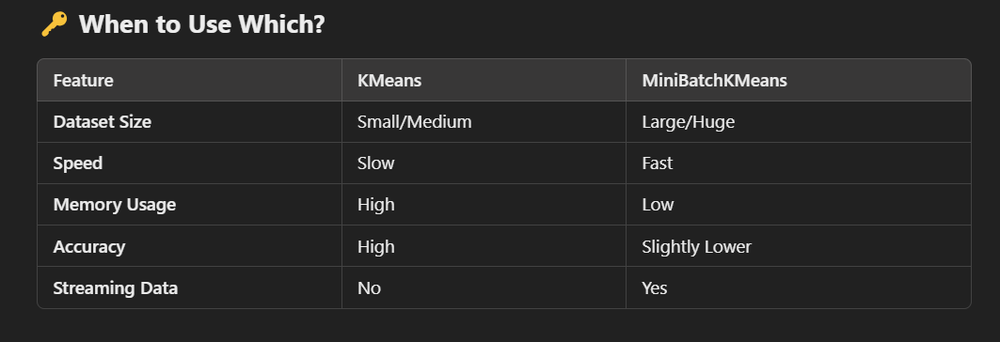

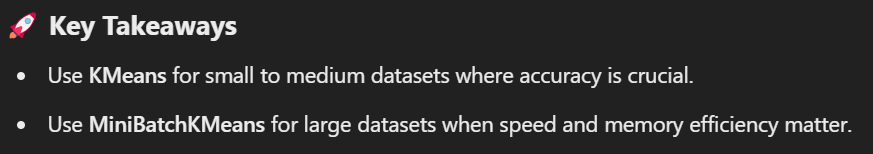

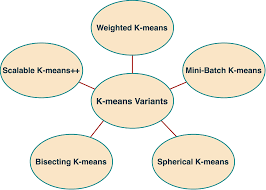 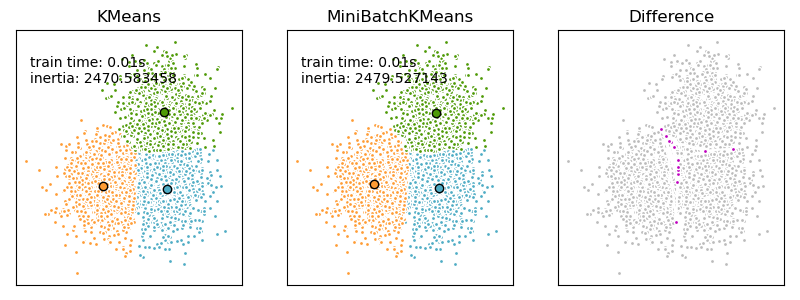

-------------------------------------------------

## **1st. MiniBatchKMeans**

In [ ]:
import numpy as np
from sklearn.cluster import MiniBatchKMeans

# ✅ Define parameters
target_clusters = 2000  

def cluster_niches_kmeans(embeddings, n_clusters, batch_size=1024):
    """Efficient K-Means clustering using MiniBatchKMeans to handle large datasets."""
    
    # ✅ Step 1: Normalize embeddings (L2 normalization for cosine similarity)
    embeddings = embeddings / np.linalg.norm(embeddings, axis=1, keepdims=True)

    # ✅ Step 2: Use MiniBatch K-Means (optimized for large datasets)
    kmeans = MiniBatchKMeans(
        n_clusters=n_clusters,
        random_state=42,
        batch_size=batch_size,
        max_iter=300,  
        n_init='auto',  
        verbose=0  
    )

    # ✅ Step 3: Fit & Predict
    cluster_labels = kmeans.fit_predict(embeddings)
    
    # ✅ Step 4: Extract cluster centroids
    cluster_centroids = kmeans.cluster_centers_

    return cluster_labels, cluster_centroids

# ✅ Perform Clustering
print(f"Clustering {len(reduced_embeddings)} niches into {target_clusters} clusters using Mini-Batch K-Means...")

# ✅ Use reduced_embeddings for clustering
cluster_labels, cluster_centroids = cluster_niches_kmeans(reduced_embeddings, n_clusters=target_clusters)

print(f"✅ Clustering complete. Created {len(set(cluster_labels))} clusters.")

Clustering 100399 niches into 2000 clusters using Mini-Batch K-Means...
✅ Clustering complete. Created 2000 clusters.


## ➡️ EAD Process To See The Result Of MiniBatchKMeans 

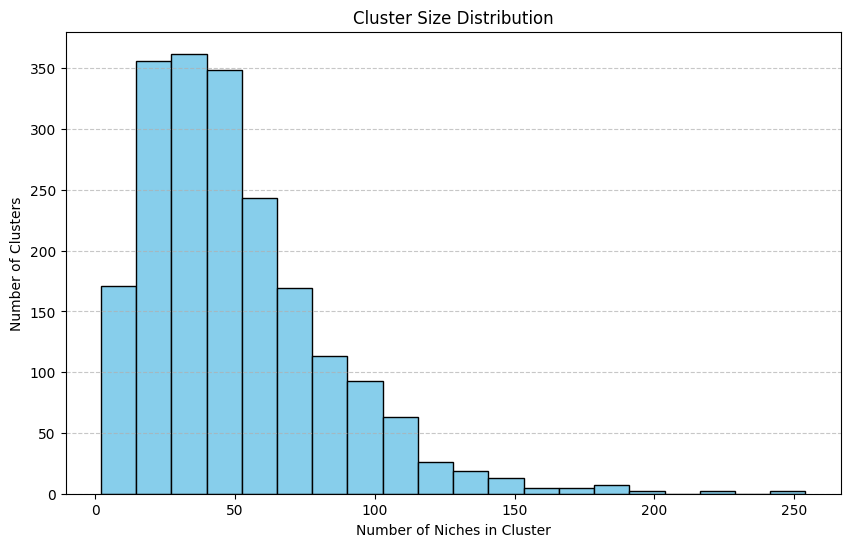

Total Clusters (from K-Means): 2000
Smallest cluster size: 2 niches
Largest cluster size: 254 niches

🔹 Top Clusters with Sample Niches:

Cluster 1974: 254 niches
Sample niches: adventure game walkthroughs, horror game walkthroughs, anime-style game playthroughs, simulation game walkthroughs, zombie game playthroughs, first person shooter walkthroughs, pc gaming walkthroughs, console gaming walkthroughs, sandbox game walkthroughs, tower defense game walkthroughs, roblox walkthroughs, horror game playthroughs, action-adventure game walkthroughs, fallout series walkthroughs, fps game tutorials and walkthroughs, career mode playthroughs, simulator game walkthroughs, gaming console walkthroughs, platformer game walkthroughs, jrpg walkthroughs, pet simulator 99 walkthroughs, role-playing game walkthroughs, sports games walkthroughs, strategy game walkthroughs, puzzle game walkthroughs, nintendo game walkthroughs, gta walkthroughs, android game walkthroughs, gameplay walkthroughs, role playi

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# ✅ 1. Organize niches into clusters efficiently
clusters = defaultdict(list)

for i, label in enumerate(cluster_labels):  # Use cluster_labels from K-Means
    if i < len(unique_niches):  # Ensure index is within range
        clusters[label].append(unique_niches[i])

# ✅ 2. Sort clusters by size (largest to smallest)
sorted_clusters_MiniBatchKMeans = sorted(clusters.items(), key=lambda x: len(x[1]), reverse=True)

# ✅ 3. Extract cluster sizes for visualization
cluster_sizes = [len(cluster) for _, cluster in sorted_clusters_MiniBatchKMeans]

# ✅ 4. Ensure clusters exist before visualization
if not cluster_sizes:
    print("⚠️ No clusters found. Ensure clustering was successful before running visualization.")
else:
    # ✅ 5. Adjust bin size dynamically for visualization
    num_bins = min(20, len(set(cluster_sizes)))  # Prevent excessive bins

    # ✅ 6. Plot histogram of cluster sizes
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_sizes, bins=num_bins, color='skyblue', edgecolor='black')
    plt.title('Cluster Size Distribution')
    plt.xlabel('Number of Niches in Cluster')
    plt.ylabel('Number of Clusters')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ✅ 7. Print Cluster Statistics
    print(f"Total Clusters (from K-Means): {len(sorted_clusters_MiniBatchKMeans)}")
    print(f"Smallest cluster size: {np.min(cluster_sizes)} niches")
    print(f"Largest cluster size: {np.max(cluster_sizes)} niches")

    # ✅ 8. Display Top Clusters
    print("\n🔹 Top Clusters with Sample Niches:")
    for i, (label, cluster) in enumerate(sorted_clusters_MiniBatchKMeans[0:]):  # Show top 10 clusters
        print(f"\nCluster {label}: {len(cluster)} niches")
        print("Sample niches:", ", ".join(cluster[0:]) + "..." if len(cluster) > 5 else ", ".join(cluster))


## ➡️ Save As Result In CSV Of MiniBatchKMeans

In [15]:
# ✅ Assign niches to clusters
clustered_niches = {}
for niche, label in zip(unique_niches, cluster_labels):
    if label not in clustered_niches:
        clustered_niches[label] = []
    clustered_niches[label].append(niche)

# ✅ Save results as a DataFrame
df_clusters = pd.DataFrame([
    {"Cluster": label, "Niches": ", ".join(niches), "Cluster Size": len(niches)}
    for label, niches in clustered_niches.items()
])

# ✅ Save as CSV
df_clusters.to_csv("clustered_niches.csv", index=False)

print("✅ Clustering results saved to clustered_niches.csv")

✅ Clustering results saved to clustered_niches.csv


## **2nd. Merge Clusters** 

In [16]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np 

# ✅ Merge Similar Clusters
def merge_similar_clusters(cluster_centroids, cluster_labels, similarity_threshold=0.99):
    """
    Merge clusters that have high cosine similarity between their centroids.
    
    Args:
        cluster_centroids (numpy.ndarray): Centroid embeddings of each cluster.
        cluster_labels (numpy.ndarray): The assigned cluster labels.
        similarity_threshold (float): Threshold above which clusters will be merged.
    
    Returns:
        numpy.ndarray: Updated cluster labels after merging.
    """
    unique_clusters = np.arange(len(cluster_centroids))  # Array of cluster indices

    # Compute cosine similarity between cluster centroids
    similarity_matrix = cosine_similarity(cluster_centroids)

    # Initialize cluster mapping (each cluster maps to itself initially)
    cluster_mapping = {cluster: cluster for cluster in unique_clusters}
    merged_clusters = []

    for i in range(len(unique_clusters)):
        for j in range(i + 1, len(unique_clusters)):
            if similarity_matrix[i, j] > similarity_threshold:
                old_cluster = unique_clusters[j]
                new_cluster = unique_clusters[i]

                # Ensure all previous mappings of old_cluster now map to new_cluster
                for key in cluster_mapping:
                    if cluster_mapping[key] == old_cluster:
                        cluster_mapping[key] = new_cluster

                merged_clusters.append((old_cluster, new_cluster))

    # Apply cluster merging
    merged_labels = np.array([cluster_mapping[label] for label in cluster_labels])

    # ✅ Print merged clusters
    if merged_clusters:
        print("\n🔍 Detected Similar Clusters (Above Threshold):")
        for old, new in merged_clusters:
            print(f"Cluster {old} ↔ Cluster {new} (Merged)")

        print(f"\n✅ Merging complete. Final number of clusters: {len(set(merged_labels))}")
    else:
        print("No clusters were merged.")

    return merged_labels

# ✅ Apply merging
merged_labels = merge_similar_clusters(cluster_centroids, cluster_labels, similarity_threshold)



🔍 Detected Similar Clusters (Above Threshold):
Cluster 134 ↔ Cluster 0 (Merged)
Cluster 239 ↔ Cluster 0 (Merged)
Cluster 355 ↔ Cluster 0 (Merged)
Cluster 356 ↔ Cluster 0 (Merged)
Cluster 392 ↔ Cluster 0 (Merged)
Cluster 468 ↔ Cluster 0 (Merged)
Cluster 542 ↔ Cluster 0 (Merged)
Cluster 651 ↔ Cluster 0 (Merged)
Cluster 832 ↔ Cluster 0 (Merged)
Cluster 835 ↔ Cluster 0 (Merged)
Cluster 844 ↔ Cluster 0 (Merged)
Cluster 955 ↔ Cluster 0 (Merged)
Cluster 974 ↔ Cluster 0 (Merged)
Cluster 1009 ↔ Cluster 0 (Merged)
Cluster 1050 ↔ Cluster 0 (Merged)
Cluster 1128 ↔ Cluster 0 (Merged)
Cluster 1208 ↔ Cluster 0 (Merged)
Cluster 1246 ↔ Cluster 0 (Merged)
Cluster 1249 ↔ Cluster 0 (Merged)
Cluster 1262 ↔ Cluster 0 (Merged)
Cluster 1283 ↔ Cluster 0 (Merged)
Cluster 1292 ↔ Cluster 0 (Merged)
Cluster 1606 ↔ Cluster 0 (Merged)
Cluster 1710 ↔ Cluster 0 (Merged)
Cluster 1907 ↔ Cluster 0 (Merged)
Cluster 1983 ↔ Cluster 0 (Merged)
Cluster 100 ↔ Cluster 1 (Merged)
Cluster 102 ↔ Cluster 1 (Merged)
Cluster 204 ↔ C

## ➡️ EAD Process To See The Merged-Clusters Results Of MiniBatchKMeans 

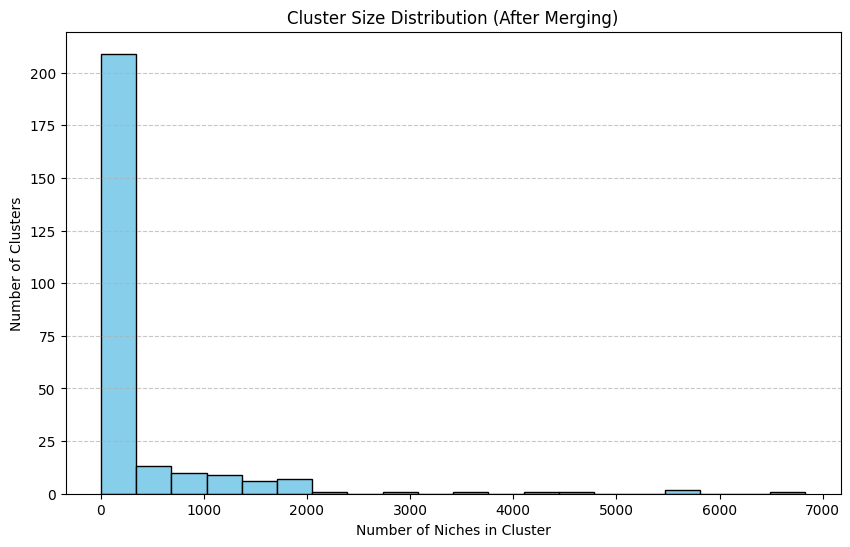

Total Clusters (after merging): 262
Smallest cluster size: 2 niches
Largest cluster size: 6832 niches

🔹 Top Clusters with Sample Niches:

Cluster 16: 6832 niches
Sample niches: indonesian music scene, indonesian music, music production, indian music covers, bollywood song covers, indian music composition, film scoring, independent music production, hindi music production, bollywood soundtracks, punjabi music collaborations, traditional dance performances, acoustic performances, punjabi music performances, indian music releases, indian hip-hop, rap music production, hip-hop culture in india, marathi music promotion, dance music fusion, indian music production, indian classical music, dance and movement, local festival showcase, music videos, emotive storytelling, emotive soundtracks, heartfelt music videos, emotive visuals, singer songwriter, faceless channel creation, k-pop music charts, live stage performances, electronic dance music, house music, techno music, pop music production, 

In [17]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# ✅ 1. Organize niches into merged clusters efficiently
clusters = defaultdict(list)

for i, label in enumerate(merged_labels):  # Use merged_labels instead of cluster_labels
    if i < len(unique_niches):  # Ensure index is within range
        clusters[label].append(unique_niches[i])

# ✅ 2. Sort clusters by size
sorted_clusters_Merged_Clusters = sorted(clusters.items(), key=lambda x: len(x[1]), reverse=True)

# ✅ 3. Extract cluster sizes for visualization
cluster_sizes = [len(cluster) for _, cluster in sorted_clusters_Merged_Clusters]

# ✅ 4. Ensure cluster sizes exist before visualization
if not cluster_sizes:
    print("⚠️ No clusters found. Ensure clustering was successful before running visualization.")
else:
    # ✅ 5. Adjust bin size dynamically for visualization
    num_bins = min(20, len(set(cluster_sizes)))  # Prevent excessive bins

    # ✅ 6. Plot histogram of cluster sizes
    plt.figure(figsize=(10, 6))
    plt.hist(cluster_sizes, bins=num_bins, color='skyblue', edgecolor='black')
    plt.title('Cluster Size Distribution (After Merging)')
    plt.xlabel('Number of Niches in Cluster')
    plt.ylabel('Number of Clusters')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # ✅ 7. Print Cluster Statistics
    print(f"Total Clusters (after merging): {len(sorted_clusters_Merged_Clusters)}")
    print(f"Smallest cluster size: {np.min(cluster_sizes)} niches")
    print(f"Largest cluster size: {np.max(cluster_sizes)} niches")

    # ✅ 8. Display Top Clusters
    print("\n🔹 Top Clusters with Sample Niches:")
    for i, (label, cluster) in enumerate(sorted_clusters_Merged_Clusters[0:]):  # Show top 10 clusters
        print(f"\nCluster {label}: {len(cluster)} niches")
        print("Sample niches:", ", ".join(cluster[0:]) + "..." if len(cluster) > 5 else ", ".join(cluster))


## ➡️ Save As Merged-Clusters Results Of MiniBatchKMeans In CSV  

In [18]:
# ✅ Assign niches to clusters
clustered_niches = {}  
for niche, label in zip(unique_niches, merged_labels):
    if label not in clustered_niches:
        clustered_niches[label] = []
    clustered_niches[label].append(niche)

# ✅ Save results as a DataFrame
df_clusters = pd.DataFrame([
    {"Cluster": label, "Niches": ", ".join(niches), "Cluster Size": len(niches)}
    for label, niches in clustered_niches.items()
])

# ✅ Save as CSV
df_clusters.to_csv("merged_clustered_niches.csv", index=False)

print("✅ Clustering results saved to merged_clustered_niches.csv")

✅ Clustering results saved to merged_clustered_niches.csv


---------------------------------

--------------------------------

# 👉 Exploratory data analysis (EDA)

## ➡️ T-SNE Projection For Merged-Clusters Results Of MiniBatchKMeans

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.manifold import TSNE
# import matplotlib.cm as cm

# # ✅ Step 1: Reduce dimensions using t-SNE with improved perplexity
# print("Running t-SNE projection...")
# tsne = TSNE(n_components=2, random_state=42, perplexity=100, learning_rate=300)
# reduced_embeddings = tsne.fit_transform(embeddings)

# print("✅ t-SNE projection completed!")

# # ✅ Step 2: Assign unique colors to each cluster
# unique_clusters = np.unique(cluster_labels)
# num_clusters = len(unique_clusters)

# # ✅ Ensure each cluster has a truly unique color (using multiple colormaps)
# color_options = np.vstack([cm.tab20b(np.linspace(0, 1, 20)), 
#                            cm.tab20c(np.linspace(0, 1, 20)), 
#                            cm.hsv(np.linspace(0, 1, num_clusters - 40))])  # Adjusted for large clusters

# colors = color_options[:num_clusters]  # Slice to match the exact number of clusters

# # ✅ Step 3: Create scatter plot with strictly unique colors
# plt.figure(figsize=(16, 12))
# for i, cluster_id in enumerate(unique_clusters):
#     indices = np.where(cluster_labels == cluster_id)[0]
#     plt.scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], 
#                 color=colors[i], label=f"Cluster {cluster_id}" if i < 1500 else "", 
#                 alpha=0.8, edgecolors="black", s=6)  # Smaller dots for clarity

# # ✅ Step 4: Show **ALL 2640 clusters** in the legend
# plt.legend(loc="upper right", markerscale=1.0, fontsize="xx-small", ncol=6, frameon=True, title="All Clusters")

# # ✅ Step 5: Finalize plot settings
# plt.title("Fully Corrected Cluster Visualization (t-SNE Projection)", fontsize=16)
# plt.xlabel("t-SNE Dimension 1", fontsize=12)
# plt.ylabel("t-SNE Dimension 2", fontsize=12)
# plt.xticks([])
# plt.yticks([])
# plt.grid(True, linestyle="--", alpha=0.5)

# # ✅ Step 6: Show the plot
# plt.show()

-----------------------------------

----------------------------------

# 👉 Generate Cluster Names With MPNET MODEL Context Awareness And Using GPU For Computational Process

## ➡️ Generate Cluster Names With (MPNET Model) WITH FREQUENCY WORDS 

In [22]:
# import re
# import numpy as np
# from sentence_transformers import SentenceTransformer
# from sklearn.preprocessing import normalize
# from sklearn.metrics.pairwise import cosine_similarity

# # ✅ Load MPNet model for better embeddings
# embedding_model = SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

# def clean_text(text):
#     """Remove special characters and lowercase words for better phrase extraction."""
#     return re.sub(r"[^a-zA-Z0-9\s]", "", text).lower()

# def extract_best_niche(niches, freq_map):
#     """Find the most contextually representative niche using MPNet embeddings and frequency weighting."""
    
#     # ✅ Step 1: Clean the text
#     cleaned_niches = [clean_text(n) for n in niches]

#     # ✅ Step 2: Convert niches into MPNet embeddings and move to GPU
#     niche_embeddings = embedding_model.encode(cleaned_niches, convert_to_tensor=True, device=device)  # Uses GPU

#     # ✅ Step 3: Normalize niche embeddings
#     niche_embeddings = torch.nn.functional.normalize(niche_embeddings, p=2, dim=1)

#     # ✅ Step 4: Compute the centroid (weighted by frequency)
#     weights = torch.tensor([freq_map.get(n, 1) for n in niches], dtype=torch.float32, device=device)
#     weighted_centroid = torch.sum(niche_embeddings * weights.unsqueeze(-1), dim=0) / torch.sum(weights)
#     weighted_centroid = weighted_centroid / torch.norm(weighted_centroid)  # Normalize centroid

#     # ✅ Step 5: Find the niche closest to the weighted centroid
#     similarities = torch.matmul(niche_embeddings, weighted_centroid)  # Compute cosine similarity
#     best_niche = niches[torch.argmax(similarities).item()]  # Pick the best matching niche

#     return best_niche

# def validate_cluster_name(cluster_name, original_niches):
#     """Ensure the final name has common words with top niches to maintain relevance."""
#     cluster_words = set(cluster_name.split())
#     niche_words = set(" ".join(original_niches[:10]).split())  # Get words from top 10 niches

#     overlap_score = len(cluster_words & niche_words) / len(cluster_words) if cluster_words else 0
#     return overlap_score  # Higher score means better match

# def get_cluster_name(cluster, freq_map):
#     """Generate a meaningful representative name for a cluster using MPNet embeddings."""

#     # ✅ Step 1: Handle empty clusters
#     if not cluster:
#         return "Miscellaneous"

#     # ✅ Step 2: Sort niches by frequency
#     sorted_niches = sorted(cluster, key=lambda x: freq_map.get(x, 0), reverse=True)

#     # ✅ Step 3: If the cluster has only one niche, return it directly
#     if len(sorted_niches) == 1:
#         return sorted_niches[0]

#     # ✅ Step 4: Find the most representative niche using a larger context (top 15)
#     best_niche = extract_best_niche(sorted_niches[:15], freq_map)

#     # ✅ Step 5: Validate the cluster name using word overlap with original niches
#     if validate_cluster_name(best_niche, sorted_niches[:10]) < 0.3:  # If overlap < 30%, use most frequent niche
#         best_niche = sorted_niches[0]

#     return best_niche  # Return the most contextually relevant niche

# # ✅ Generate Cluster Names with MPNet Context Awareness
# merged_niches = []
# for label, cluster in sorted_clusters:
#     # ✅ Get frequency map for the cluster
#     cluster_freq = {niche: frequency_map.get(niche, 0) for niche in cluster}

#     # ✅ Generate a context-aware representative name
#     merged_name = get_cluster_name(cluster, cluster_freq)

#     # ✅ Add to results
#     merged_niches.append({
#         "merged_name": merged_name,
#         "original_niches": cluster,
#         "total_frequency": sum(cluster_freq.values()),
#         "cluster_size": len(cluster)
#     })

# # ✅ Display Clusters
# print("\nAll Clusters With Their Name:")
# for i, cluster in enumerate(merged_niches):  
#     print(f"{i+1}. {cluster['merged_name']} ({cluster['cluster_size']} niches, {cluster['total_frequency']} occurrences)")
#     print(f"   Sample niches: {', '.join(cluster['original_niches'][:5])} ...\n")

## ➡️ Generate Cluster Names With (MPNET Model) Without Frequency Words

In [19]:
import torch
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

# ✅ Check if CUDA (GPU) is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# ✅ Model Name (Using `Flan-T5-Large` for better efficiency)
model_name = "google/flan-t5-large"

# ✅ Load Tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name)

# ✅ Load Model with FP16 (Lower VRAM Usage)
model = AutoModelForSeq2SeqLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32  # ✅ Use FP16 for GPU, FP32 for CPU
).to(device)  # ✅ Move model to GPU or CPU

# ✅ Create Function for Generating Cluster Names
def get_cluster_name(cluster):
    """Generate a meaningful representative name for a cluster using Flan-T5-Large."""

    # ✅ Step 1: Handle empty clusters
    if not cluster:
        return "Miscellaneous"

    # ✅ Step 2: Format input prompt
    prompt = f"Generate a short and meaningful category name for the following topics keep atlest 2 words: {', '.join(cluster[:200])}."

    # ✅ Tokenize input and generate output
    inputs = tokenizer(prompt, return_tensors="pt", padding=True, truncation=True).to(device)
    outputs = model.generate(**inputs, max_length=20)  # ✅ Use `.generate()`

    return tokenizer.decode(outputs[0], skip_special_tokens=True)  # ✅ Return clean text output

# ✅ Generate Cluster Names in Batches (Avoid OOM)
def generate_cluster_names(sorted_clusters, batch_size=5):
    """Generate cluster names efficiently in batches to avoid OOM errors."""
    merged_niches = []
    for i in range(0, len(sorted_clusters), batch_size):
        batch = sorted_clusters[i : i + batch_size]
        for label, cluster in batch:
            merged_name = get_cluster_name(cluster)  # ✅ Generate name for each cluster
            merged_niches.append({
                "Generated_Cluster_Name": merged_name,
                "List_Of_Niches_In_The_Cluster": cluster,
                "Number_Of_Niches_In_The_Cluster": len(cluster)  # ✅ Fix TypeError
            })
    return merged_niches

# ✅ Execute Batch Processing
merged_niches = generate_cluster_names(sorted_clusters_Merged_Clusters)

# ✅ Display Clusters
print("\nAll Clusters With Their Name:")
for i, cluster in enumerate(merged_niches):  
    print(f"{i+1}. {cluster['Generated_Cluster_Name']} ({cluster['Number_Of_Niches_In_The_Cluster']} niches)")
    print(f"   Cluster niches: {', '.join(cluster['List_Of_Niches_In_The_Cluster'][0:])} ...\n")

Using device: cuda

All Clusters With Their Name:
1. music (6832 niches)
   Cluster niches: indonesian music scene, indonesian music, music production, indian music covers, bollywood song covers, indian music composition, film scoring, independent music production, hindi music production, bollywood soundtracks, punjabi music collaborations, traditional dance performances, acoustic performances, punjabi music performances, indian music releases, indian hip-hop, rap music production, hip-hop culture in india, marathi music promotion, dance music fusion, indian music production, indian classical music, dance and movement, local festival showcase, music videos, emotive storytelling, emotive soundtracks, heartfelt music videos, emotive visuals, singer songwriter, faceless channel creation, k-pop music charts, live stage performances, electronic dance music, house music, techno music, pop music production, malaysian music, child singers, ukulele music, child performers, hip-hop culture, visu

In [22]:
import csv
import pandas as pd

# ✅ Define CSV Export Function
def save_clusters_to_csv(merged_niches, filename="cluster_names.csv"):
    """Save the generated cluster names and details to a CSV file."""
    
    # Using pandas for better structure
    df = pd.DataFrame(merged_niches)
    
    # ✅ Save to CSV
    df.to_csv(filename, index=False, encoding='utf-8')
    print(f"CSV file saved successfully: {filename}")

# ✅ Execute CSV Export
save_clusters_to_csv(merged_niches)

CSV file saved successfully: cluster_names.csv


In [26]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import torch
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

# ✅ Check if CUDA (GPU) is available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# ✅ Model Name (Flan-T5-Large, due to VRAM limits)
model_name = "google/flan-t5-large"

# ✅ Load Tokenizer
tokenizer = AutoTokenizer.from_pretrained(model_name)

# ✅ Load Model with FP16 (Lower VRAM Usage)
model = AutoModelForSeq2SeqLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32  # ✅ Use FP16 for GPU, FP32 for CPU
).to(device)  # ✅ Move model to GPU or CPU

# ✅ Create Function for Generating Cluster Names

def get_cluster_name(cluster):
    """Generate a meaningful representative name for a cluster using Flan-T5-Large."""

    # ✅ Step 1: Handle empty clusters
    if not cluster:
        return "Miscellaneous"

    # ✅ Step 2: Format input prompt
    prompt = f"""You are an expert in categorizing topics. Given the following niche topics, generate a short, meaningful, and specific category name that accurately represents them: {', '.join(cluster[:200])}.
    Your response should be:
    1. A maximum of 2 words.
    """     
    # ✅ Tokenize input and generate output
    inputs = tokenizer(prompt, return_tensors="pt", padding=True, truncation=True).to(device)
    outputs = model.generate(
        **inputs, 
        # max_length=20, 
        num_beams=10,  # ✅ Beam search for better results
        # temperature=0.7,  # ✅ Control diversity
        # top_k=50,  # ✅ Sample from top 50 words
        # top_p=0.9,  # ✅ Nucleus sampling
        # early_stopping=True
    )

    return tokenizer.decode(outputs[0], skip_special_tokens=True)  # ✅ Return clean text output

# ✅ Generate Cluster Names in Batches (Avoid OOM)
def generate_cluster_names(sorted_clusters, batch_size=5):
    """Generate cluster names efficiently in batches to avoid OOM errors."""
    merged_niches = []
    for i in range(0, len(sorted_clusters), batch_size):
        batch = sorted_clusters[i : i + batch_size]
        for label, cluster in batch:
            merged_name = get_cluster_name(cluster)  # ✅ Generate name for each cluster
            merged_niches.append({
                "Generated_Cluster_Name": merged_name,
                "List_Of_Niches_In_The_Cluster": cluster,
                "Number_Of_Niches_In_The_Cluster": len(cluster)  # ✅ Fix TypeError
            })
    return merged_niches

# ✅ Execute Batch Processing
merged_niches = generate_cluster_names(sorted_clusters_Merged_Clusters)

# ✅ Display Clusters
print("\nAll Clusters With Their Name:")
for i, cluster in enumerate(merged_niches):  
    print(f"{i+1}. {cluster['Generated_Cluster_Name']} ({cluster['Number_Of_Niches_In_The_Cluster']} niches)")
    print(f"   Cluster niches: {', '.join(cluster['List_Of_Niches_In_The_Cluster'][0:])} ...\n")

Using device: cuda

All Clusters With Their Name:
1. Entrepreneurship in dubai (5658 niches)
   Cluster niches: small business management, startup success stories, online shopping for clothing, online fashion shopping, indian market trends and preferences, immigration process guidance, entrepreneurship stories, personal finance management, investment strategies, social media trends in india, budgeting for family, product purchasing decisions, savings and investment tips, online business and marketing, social media growth, marketing strategies, tech trends in india, entrepreneurship in india, small business promotions, indian market trends, indian startup stories, small business management tips, entrepreneurship advice, visa process guidance, entrepreneurial journey sharing, coffee brand ownership and management, small business growth and marketing strategies, youtuber earnings and expenses, indian startup features, local business promotions, real estate business management, promoting h

## ➡️ Optimized Code Using GPU for Faster Computation for Accuracy

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Load the CSV file
file_path = "/home/karthik22/ML_Project/Niche_List_Grouping/cluster_names.csv"
df = pd.read_csv(file_path)

# Function to compute TF-IDF cosine similarity
def compute_tfidf_similarity(cluster_name, niches_list):
    """Compute TF-IDF based cosine similarity between cluster name and niche list."""
    if not isinstance(niches_list, str):
        return 0  # Return 0 similarity if the data is not a valid string

    # Convert list to string safely
    try:
        niches_text = ' '.join(eval(niches_list))  # Convert list-like string back to actual string
    except:
        niches_text = niches_list  # Use the string as is if conversion fails

    # Vectorize text
    vectorizer = TfidfVectorizer()
    vectors = vectorizer.fit_transform([cluster_name, niches_text])
    
    # Compute cosine similarity
    return cosine_similarity(vectors[0], vectors[1])[0][0]

# Compute TF-IDF cosine similarity for each row
df['TFIDF_Similarity'] = df.apply(
    lambda row: compute_tfidf_similarity(row['Generated_Cluster_Name'], row['List_Of_Niches_In_The_Cluster']), axis=1
)

# Save the results to a new CSV file
df.to_csv("cluster_name_accuracy.csv", index=False)

# Display the first few rows
print(df.head())

  Generated_Cluster_Name                      List_Of_Niches_In_The_Cluster  \
0                  music  ['punjabi music', 'indonesian music scene', "r...   
1       esports analysis  ['walkthroughs', 'cricket analysis', 'arcade g...   
2       Entrepreneurship  ['small business management', 'women entrepren...   
3               wellness  ['wellness', 'positive lifestyle', 'health and...   
4      Home Organization  ['upcycling and repurposing', 'crafting and ho...   

   Number_Of_Niches_In_The_Cluster  TFIDF_Similarity  
0                             7018          0.814207  
1                             5704          0.200645  
2                             4848          0.119799  
3                             4598          0.211121  
4                             4176          0.174609  


In [103]:
# ✅ Handle case where there are no clusters
if not merged_niches:
    print("\n⚠️ No clusters found. Check your clustering process.")
else:
    print(f"\n📊 Displaying All {len(merged_niches)} Clusters:")
    print("=" * 60)

    for i, cluster in enumerate(merged_niches):  # ✅ Iterate over all clusters
        merged_name = cluster["merged_name"]
        cluster_size = cluster["cluster_size"]
        group_niches = cluster["original_niches"][:5]  # First 5 niches

        print(f"🔹 {i+1}. {merged_name} ({cluster_size} niches)")
        print(f"   Group Niches: {', '.join(group_niches)}")

        # ✅ Show count of remaining niches if more than 5
        remaining_count = cluster_size - len(group_niches)
        if remaining_count > 0:
            print(f"   ... and {remaining_count} more niches.")

        print("=" * 60)  # Formatting separator



📊 Displaying All 1500 Clusters:
🔹 1. fashion trends and styling (458 niches)
   Group Niches: fashion trends, middle eastern fashion trends, women's summer fashion, fashion and trends, fashion and style
   ... and 453 more niches.
🔹 2. cultural comedy (359 niches)
   Group Niches: positive comedy, reaction comedy, sitcom style comedy, social commentary comedy, family oriented comedy
   ... and 354 more niches.
🔹 3. cultural analysis (358 niches)
   Group Niches: cultural relevance, cultural content creation, cultural lifestyle showcase, cultural education, cultural practices
   ... and 353 more niches.
🔹 4. indian culture and society (351 niches)
   Group Niches: indian culture, indian cultural experiences, indian cultural spirituality, indian cultural and social trends, indian cultural heritage
   ... and 346 more niches.
🔹 5. digital art and graphic design (349 niches)
   Group Niches: performance art, artistic movement documentation, fine art and creative photography, art history d

------------------------------------

👉 Expract Result in (merged_niches_result.json) file 

In [108]:
import json
import os
import numpy as np

# ✅ Define output file
output_file = "merged_niches_result.json"

# ✅ Function to convert NumPy types to standard Python types
def convert_numpy(obj):
    """Recursively converts numpy data types to native Python types."""
    if isinstance(obj, np.integer):  # Convert np.int32, np.int64 to int
        return int(obj)
    elif isinstance(obj, np.floating):  # Convert np.float32, np.float64 to float
        return float(obj)
    elif isinstance(obj, np.ndarray):  # Convert np.array to list
        return obj.tolist()
    elif isinstance(obj, list):  # Recursively handle lists
        return [convert_numpy(i) for i in obj]
    elif isinstance(obj, dict):  # Recursively handle dictionaries
        return {key: convert_numpy(value) for key, value in obj.items()}
    else:
        return obj  # Return other types as they are

# ✅ Check if `merged_niches` is not empty before saving
if merged_niches:
    try:
        # ✅ Convert all NumPy types to Python native types
        merged_niches_python = convert_numpy(merged_niches)

        # ✅ Save clusters as JSON with UTF-8 encoding
        with open(output_file, 'w', encoding='utf-8') as f:
            json.dump(merged_niches_python, f, indent=2)

        # ✅ Print success message and file size
        file_size_kb = os.path.getsize(output_file) / 1024
        print(f"✅ Clusters successfully saved to {output_file} ({file_size_kb:.2f} KB)")
        print(f"Saved merged niches to {output_file}")

    except Exception as e:
        print(f"❌ Error saving file: {e}")

else:
    print("⚠️ No clusters to save. Check the clustering process.")


✅ Clusters successfully saved to merged_niches_result.json (3732.36 KB)
Saved merged niches to merged_niches_result.json


In [30]:
import json

output_file = "merged_niches_result.json"  # Replace with actual filename

# ✅ Load the JSON properly
with open(output_file, "r", encoding="utf-8") as f:
    merged_niches = json.load(f)

# ✅ Verify the structure
print("✅ Type of merged_niches:", type(merged_niches))
if merged_niches:
    print("✅ Type of first element:", type(merged_niches[0]))
    print("🔍 First element preview:", repr(merged_niches[0]))  # Show exact content


✅ Type of merged_niches: <class 'list'>
✅ Type of first element: <class 'dict'>
🔍 First element preview: {'merged_name': 'fashion trends and styling', 'original_niches': ['fashion trends', 'middle eastern fashion trends', "women's summer fashion", 'fashion and trends', 'fashion and style', 'bohemian fashion and style', 'fashion trends and style', 'western fashion trends', 'fashion trends and analysis', 'sustainable and eco-friendly fashion', 'festive fashion trends', 'modern fashion trends and styles', "women's fashion and style", 'fashion lifestyle', 'casual fashion', 'fashion hacks', 'fashion diys', "men's fashion trends", 'korean fashion trends', 'fashion trends and forecasting', 'food and fashion', 'festive fashion', 'animal-influenced fashion and trends', 'modern fashion trends', 'affordable fashion trends', 'diy fashion projects', 'festival fashion trends', 'trendy and affordable fashion', 'fashion trends and styles', 'lifestyle fashion', 'fashion and design', 'local fashion styl

-------------------------------------

👉 Create mapping from Original Niches To Merged Niches

In [37]:
# ✅ Create mapping from original niches to merged niches
niche_mapping = {
    original: cluster["merged_name"]
    for cluster in merged_niches
    for original in cluster["original_niches"]
}


In [38]:
# ✅ Convert original niches to merged ones safely
original_to_merged = [
    niche_mapping.get(normalize_niche(niche), "Unknown Cluster")
    for niche in all_niches
]

# ✅ Print sample output for verification
print("✅ Sample Mappings:", original_to_merged[0:])


✅ Sample Mappings: ['indian culture comedy', 'indian culture comedy', 'punjabi cultural music', 'indian cultural music', 'daily life of indian families', 'punjabi cultural music', 'entertainment news', 'personal vlogging', 'behind-the-scenes filmmaking', 'lifestyle vlogs', 'cultural vlogs', 'indonesian music and culture', 'family relationships and interactions', 'indonesian music and culture', 'islamic music', 'indonesian music and culture', 'bhakti culture', 'food reviews', 'food challenges', 'musician vlogs', 'family life vlogging', 'indonesian music and culture', 'home cooking', 'indonesian music and culture', 'music production', 'parenting strategies', 'building and maintaining relationships', 'personal vlogging', 'building and maintaining relationships', 'personal growth and development', 'family relationships and interactions', 'indian culture and society', 'personal life stories', 'personal development and self-improvement', 'daily life of indian families', 'bodybuilding exercis

In [33]:
import pandas as pd

# ✅ Ensure `all_niches` and `original_to_merged` have the same length
assert len(all_niches) == len(original_to_merged), "⚠️ Mismatch: all_niches and original_to_merged must have the same length!"

# ✅ Create the DataFrame for all niches (full dataset)
mapping_df = pd.DataFrame({
    'original_niche': all_niches,
    'normalized': [normalize_niche(niche) for niche in all_niches],
    'merged_niche': original_to_merged
})

# ✅ Display the DataFrame (Jupyter/IPython)
print("✅ Niche Mapping DataFrame Created. Preview:")
display(mapping_df)  # Works in Jupyter Notebook

# ✅ OR print first few rows (for terminal-based environments)
print(mapping_df.head(10))  # Show the first 10 rows


✅ Niche Mapping DataFrame Created. Preview:


,original_niche,normalized,merged_niche
0,Punjabi Comedy,punjabi comedy,indian culture comedy
1,Indian Humor,indian humor,indian culture comedy
2,Punjabi Music,punjabi music,punjabi cultural music
3,Indian Music Culture,indian music culture,indian cultural music
4,Indian Lifestyle,indian lifestyle,daily life of indian families
...,...,...,...
114655,Synth Music Composition,synth music composition,music production
114656,Electronic Music Production Tips,electronic music production tips,music production
114657,Original Character Development,original character development,character development and design
114658,Phone Artistry,phone artistry,digital art and graphic design


         original_niche            normalized                   merged_niche
0        Punjabi Comedy        punjabi comedy          indian culture comedy
1          Indian Humor          indian humor          indian culture comedy
2         Punjabi Music         punjabi music         punjabi cultural music
3  Indian Music Culture  indian music culture          indian cultural music
4      Indian Lifestyle      indian lifestyle  daily life of indian families
5       Punjabi Culture       punjabi culture         punjabi cultural music
6    Entertainment News    entertainment news             entertainment news
7        Personal Vlogs        personal vlogs              personal vlogging
8     Behind The Scenes     behind the scenes   behind-the-scenes filmmaking
9       Lifestyle Vlogs       lifestyle vlogs                lifestyle vlogs


In [34]:
print("\nSample of original to merged mapping:")
display(mapping_df)



Sample of original to merged mapping:


,original_niche,normalized,merged_niche
0,Punjabi Comedy,punjabi comedy,indian culture comedy
1,Indian Humor,indian humor,indian culture comedy
2,Punjabi Music,punjabi music,punjabi cultural music
3,Indian Music Culture,indian music culture,indian cultural music
4,Indian Lifestyle,indian lifestyle,daily life of indian families
...,...,...,...
114655,Synth Music Composition,synth music composition,music production
114656,Electronic Music Production Tips,electronic music production tips,music production
114657,Original Character Development,original character development,character development and design
114658,Phone Artistry,phone artistry,digital art and graphic design


In [39]:
import os

# ✅ Ensure the output file is properly saved before downloading
assert 'output_file' in locals(), "⚠️ Error: output_file variable is not defined!"
assert os.path.exists(output_file), f"⚠️ Error: The file '{output_file}' does not exist!"

print(f"\n✅ File saved successfully: {output_file}")
print("➡️ You can manually access it from your file explorer or use the command below to move it:")

# ✅ Provide a command to move the file (if needed)
print(f"\n📂 To move the file, use: mv {output_file} /desired/path/")



✅ File saved successfully: merged_niches_result.json
➡️ You can manually access it from your file explorer or use the command below to move it:

📂 To move the file, use: mv merged_niches_result.json /desired/path/
